In [1]:
'''
The below is to just grab the source files from this guy's github.
'''

'''import urllib.request
from pathlib import Path
from urllib.error import HTTPError
#from tqdm.notebook import tqdm 
#from sklearn import preprocessing

DATASET_PATH = Path("data")
if not DATASET_PATH.exists():
    DATASET_PATH.mkdir()

# URL for downloading data
data_url = "https://raw.githubusercontent.com/naity/citeseq_autoencoder/master/data/"

# Files to download
data_files = ["rna_scale.csv.gz", "protein_scale.csv.gz", "metadata.csv.gz"]

# Download datafile if necessary
for file_name in data_files:
    file_path = Path(DATASET_PATH/file_name)
    if not file_path.exists():
        file_url = data_url + file_name
        print(f"Downloading {file_url}...")
        try:
            urllib.request.urlretrieve(file_url, file_path)
        except HTTPError as e:
            print("Something went wrong. Please try downloading the file from the Google Drive folder\n", e)'''

'import urllib.request\nfrom pathlib import Path\nfrom urllib.error import HTTPError\n#from tqdm.notebook import tqdm \n#from sklearn import preprocessing\n\nDATASET_PATH = Path("data")\nif not DATASET_PATH.exists():\n    DATASET_PATH.mkdir()\n\n# URL for downloading data\ndata_url = "https://raw.githubusercontent.com/naity/citeseq_autoencoder/master/data/"\n\n# Files to download\ndata_files = ["rna_scale.csv.gz", "protein_scale.csv.gz", "metadata.csv.gz"]\n\n# Download datafile if necessary\nfor file_name in data_files:\n    file_path = Path(DATASET_PATH/file_name)\n    if not file_path.exists():\n        file_url = data_url + file_name\n        print(f"Downloading {file_url}...")\n        try:\n            urllib.request.urlretrieve(file_url, file_path)\n        except HTTPError as e:\n            print("Something went wrong. Please try downloading the file from the Google Drive folder\n", e)'

In [10]:
# Import all relevant packages for later
import time
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm 
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model
import tensorflow as tf
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from subprocess import call

In [3]:
# use Pandas to read the data
# The index column refers to the barcode of each individual cell that
# They performed scRNA-seq on
# The transpose function used here is to so that 1 row = 1 cell
# rather than 1 column = 1 cell. I rather this shape than the other shape
# in pandas anw.
rna = pd.read_csv("data/rna_scale.csv.gz", index_col = 0).T
pro = pd.read_csv("data/protein_scale.csv.gz", index_col = 0).T

In [4]:
# Just visually inspect the tables
# 30,672 rows = number of cells
# 2000 columns = 2,000 genes identified
# 25 columns = 25 proteins identified
# What do the numbers mean??? I'm going to assume its normalized read counts
# of different genes between cells.
display(rna)
display(pro)

,IGKC,HBA2,HBB,HBA1,IGHA1,IGLC2,JCHAIN,HBM,IGHG1,IGHM,...,INSR,RAD23B,COMMD4,PPARA,PFDN6,PDSS1,BANF1,DDI2,DCAF6,HSPA5
a_AAACCTGAGCTTATCG-1,-0.428204,0.183748,0.406723,-0.488968,1.248214,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.216175,2.892558,-0.237605,-0.122832,-0.329040,-0.130763,-0.506981,3.164261,-0.197585,-0.44033
a_AAACCTGAGGTGGGTT-1,-1.047339,-0.601956,-0.985002,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,4.964708,-0.414643,...,-0.216175,-0.342985,-0.237605,-0.122832,-0.329040,-0.130763,-0.506981,-0.171434,-0.197585,-0.44033
a_AAACCTGAGTACATGA-1,-1.047339,-0.601956,1.534527,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.216175,-0.342985,6.509144,-0.122832,-0.329040,-0.130763,-0.506981,-0.171434,-0.197585,-0.44033
a_AAACCTGCAAACCTAC-1,0.080052,0.828744,0.614775,1.051572,-0.552748,0.713069,-0.324617,-0.181656,-0.200979,-0.414643,...,4.322459,-0.342985,4.264288,-0.122832,-0.329040,-0.130763,-0.506981,-0.171434,-0.197585,-0.44033
a_AAACCTGCAAGGTGTG-1,0.953832,-0.601956,0.794895,-0.488968,1.413335,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.216175,-0.342985,-0.237605,-0.122832,3.360494,-0.130763,-0.506981,-0.171434,-0.197585,-0.44033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b_TTTGTCATCCGAGCCA-1,-1.047339,0.763410,-0.985002,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.216175,-0.342985,4.058706,-0.122832,-0.329040,-0.130763,-0.506981,-0.171434,-0.197585,-0.44033
b_TTTGTCATCCGTAGGC-1,0.201403,-0.601956,-0.985002,-0.488968,1.357471,0.855927,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.216175,-0.342985,-0.237605,-0.122832,-0.329040,-0.130763,-0.506981,-0.171434,-0.197585,-0.44033
b_TTTGTCATCCTCGCAT-1,-0.160723,-0.601956,-0.071374,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,1.089121,...,-0.216175,-0.342985,-0.237605,-0.122832,2.216122,-0.130763,-0.506981,-0.171434,-0.197585,1.43400
b_TTTGTCATCGCCGTGA-1,0.527459,0.854063,0.197296,1.078835,-0.552748,1.239768,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.216175,-0.342985,-0.237605,-0.122832,-0.329040,-0.130763,-0.506981,-0.171434,-0.197585,-0.44033


,CD11a,CD11c,CD123,CD127-IL7Ra,CD14,CD16,CD161,CD19,CD197-CCR7,CD25,...,CD38,CD4,CD45RA,CD45RO,CD56,CD57,CD69,CD79b,CD8a,HLA.DR
a_AAACCTGAGCTTATCG-1,-1.849174,-0.372667,-0.072177,-0.634849,-0.464785,0.207650,-0.005108,-0.361779,0.691453,0.492961,...,1.046025,-0.578292,-0.685804,-0.618250,0.486534,1.084345,0.114363,-0.279477,-0.474619,0.998738
a_AAACCTGAGGTGGGTT-1,0.343613,-1.012818,-0.474588,1.776928,-0.672261,-0.152689,5.036511,-0.352564,-1.541172,-0.942280,...,-0.665740,1.435716,-1.205478,0.359657,2.607521,-0.612902,-1.146097,0.245467,-0.762164,-0.838409
a_AAACCTGAGTACATGA-1,-0.829742,-0.847536,-0.675120,0.705449,-0.654620,-0.427962,-0.443269,-0.478648,-0.552103,-1.208599,...,0.010368,1.745735,0.426769,-1.072402,-0.223553,1.059687,-0.635409,-0.844739,-0.448139,-1.074838
a_AAACCTGCAAACCTAC-1,0.157304,-0.601292,-0.558123,0.758353,-0.660516,-0.384782,0.052340,-0.413611,-0.338678,-0.098834,...,-0.202340,1.596914,-1.300920,2.089684,-0.637078,-0.166773,-0.541819,-0.646660,-0.663541,-0.589663
a_AAACCTGCAAGGTGTG-1,1.606986,1.762460,0.264567,-0.918552,2.004037,-0.497364,-0.392328,-0.327233,-0.539660,-0.375834,...,1.264582,-0.308044,-1.246741,0.639829,-0.511057,0.300100,1.660178,-0.351614,-0.581021,0.766440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b_TTTGTCATCCGAGCCA-1,-0.243300,-0.530023,-0.604087,1.817812,-0.414834,-0.286804,2.046097,-0.316868,-0.621508,1.130546,...,-1.112603,1.543355,-1.221743,0.703772,-0.173701,-0.540937,-0.558657,-0.455431,-0.842626,-0.665551
b_TTTGTCATCCGTAGGC-1,-1.103063,-0.684284,0.329416,0.376356,-0.589913,-0.353159,-0.485167,-0.341409,1.074882,-0.798820,...,-0.095524,1.318569,0.731735,-0.816997,-0.412921,0.383011,-0.115901,-0.635034,-0.720028,-1.275152
b_TTTGTCATCCTCGCAT-1,1.660304,1.858237,2.393709,-0.922843,-0.376290,4.419999,-0.321459,-0.472670,-0.625215,-0.542800,...,-0.949871,0.003409,0.092034,-0.510143,-0.210134,-0.281397,-0.889751,0.032187,-0.691829,1.048231
b_TTTGTCATCGCCGTGA-1,-1.227579,-0.677577,-0.306293,0.600441,-0.679098,0.056356,-0.326273,-0.180392,1.368156,-0.659950,...,-0.731306,1.201839,0.110013,-0.079395,-0.444803,0.252743,-0.597112,-0.114190,-0.629199,-1.072507


In [5]:
# This is just to check if all the barcodes in the rna dataset
# is found in the protein barcode.
assert all(rna.index == pro.index)

# if they are, we can combine them column-wise.
# so that we have single-celled data for both RNA counts + protein counts
cite_seq_data = pd.concat([rna, pro], axis = 1)
cite_seq_data.head()

,IGKC,HBA2,HBB,HBA1,IGHA1,IGLC2,JCHAIN,HBM,IGHG1,IGHM,...,CD38,CD4,CD45RA,CD45RO,CD56,CD57,CD69,CD79b,CD8a,HLA.DR
a_AAACCTGAGCTTATCG-1,-0.428204,0.183748,0.406723,-0.488968,1.248214,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,1.046025,-0.578292,-0.685804,-0.618250,0.486534,1.084345,0.114363,-0.279477,-0.474619,0.998738
a_AAACCTGAGGTGGGTT-1,-1.047339,-0.601956,-0.985002,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,4.964708,-0.414643,...,-0.665740,1.435716,-1.205478,0.359657,2.607521,-0.612902,-1.146097,0.245467,-0.762164,-0.838409
a_AAACCTGAGTACATGA-1,-1.047339,-0.601956,1.534527,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,0.010368,1.745735,0.426769,-1.072402,-0.223553,1.059687,-0.635409,-0.844739,-0.448139,-1.074838
a_AAACCTGCAAACCTAC-1,0.080052,0.828744,0.614775,1.051572,-0.552748,0.713069,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.202340,1.596914,-1.300920,2.089684,-0.637078,-0.166773,-0.541819,-0.646660,-0.663541,-0.589663
a_AAACCTGCAAGGTGTG-1,0.953832,-0.601956,0.794895,-0.488968,1.413335,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,1.264582,-0.308044,-1.246741,0.639829,-0.511057,0.300100,1.660178,-0.351614,-0.581021,0.766440


In [6]:
# This is just to load the metadata for each cell. From the above data,
# we only know the barcode, but this file contains barcode --> cell type info
meta_data = pd.read_csv('data/metadata.csv.gz', index_col = 0)

# Lets grab meaningful labels first
display(meta_data.head())

# Renaming stuf so its easier to read
meta_data['celltype'] = meta_data['celltype.l1']
meta_data.loc[meta_data['celltype.l2'].str.startswith("CD4"), 'celltype'] = 'CD4'
meta_data.loc[meta_data['celltype.l2'].str.startswith("CD8"), 'celltype'] = 'CD8'
meta_data.loc[meta_data['celltype.l2']=='Treg', 'celltype'] = 'CD4'
meta_data.loc[meta_data['celltype.l2']=='MAIT', 'celltype'] = 'MAIT'
meta_data.loc[meta_data['celltype.l2']=='gdT', 'celltype'] = 'gdT'

# Check if we missed anything in renaming
#print(meta_data['celltype'].unique())


# Convert cell annotation to integers
labels = preprocessing.LabelEncoder().fit_transform(meta_data['celltype'])

data_with_targets = cite_seq_data.copy()
data_with_targets['cell_int'] = labels
#display(data_with_targets)


# Check if the length is correct while conversion
# Just note that if we're going to do supervised neural nets with targets
# The loss should be SparseCategoricalEntropy as it is a MULTI-CLASS labelling and not encoded in one-hot vector format
print(np.unique(labels))

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,lane,donor,celltype.l1,celltype.l2,RNA.weight,ADT.weight,wsnn_res.2,seurat_clusters
a_AAACCTGAGCTTATCG-1,bmcite,7546,2136,1350,25,HumanHTO4,batch1,Progenitor cells,Prog_RBC,0.487299,0.512701,19,19
a_AAACCTGAGGTGGGTT-1,bmcite,1029,437,2970,25,HumanHTO1,batch1,T cell,gdT,0.245543,0.754457,10,10
a_AAACCTGAGTACATGA-1,bmcite,1111,429,2474,23,HumanHTO5,batch1,T cell,CD4 Naive,0.501680,0.498320,1,1
a_AAACCTGCAAACCTAC-1,bmcite,2741,851,4799,25,HumanHTO3,batch1,T cell,CD4 Memory,0.431308,0.568692,4,4
a_AAACCTGCAAGGTGTG-1,bmcite,2099,843,5434,25,HumanHTO2,batch1,Mono/DC,CD14 Mono,0.572097,0.427903,2,2


[0 1 2 3 4 5 6 7]


In [7]:
# Shuffle using train test split
# Unbind labels so that we remove this information from the machine learning algo.
lab = data_with_targets.iloc[:,-1]
data = data_with_targets.iloc[:,0:-1]

train_data, test_data, train_labels, test_labels = train_test_split(data, lab, random_state = 0, train_size = 0.6)
display(train_data)

,IGKC,HBA2,HBB,HBA1,IGHA1,IGLC2,JCHAIN,HBM,IGHG1,IGHM,...,CD38,CD4,CD45RA,CD45RO,CD56,CD57,CD69,CD79b,CD8a,HLA.DR
a_AAACCTGAGCTTATCG-1,-0.428204,0.183748,0.406723,-0.488968,1.248214,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,1.046025,-0.578292,-0.685804,-0.618250,0.486534,1.084345,0.114363,-0.279477,-0.474619,0.998738
a_AAACCTGAGGTGGGTT-1,-1.047339,-0.601956,-0.985002,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,4.964708,-0.414643,...,-0.665740,1.435716,-1.205478,0.359657,2.607521,-0.612902,-1.146097,0.245467,-0.762164,-0.838409
a_AAACCTGAGTACATGA-1,-1.047339,-0.601956,1.534527,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,0.010368,1.745735,0.426769,-1.072402,-0.223553,1.059687,-0.635409,-0.844739,-0.448139,-1.074838
a_AAACCTGCAAACCTAC-1,0.080052,0.828744,0.614775,1.051572,-0.552748,0.713069,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.202340,1.596914,-1.300920,2.089684,-0.637078,-0.166773,-0.541819,-0.646660,-0.663541,-0.589663
a_AAACCTGCAAGGTGTG-1,0.953832,-0.601956,0.794895,-0.488968,1.413335,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,1.264582,-0.308044,-1.246741,0.639829,-0.511057,0.300100,1.660178,-0.351614,-0.581021,0.766440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b_TTTGTCATCCGAGCCA-1,-1.047339,0.763410,-0.985002,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,-1.112603,1.543355,-1.221743,0.703772,-0.173701,-0.540937,-0.558657,-0.455431,-0.842626,-0.665551
b_TTTGTCATCCGTAGGC-1,0.201403,-0.601956,-0.985002,-0.488968,1.357471,0.855927,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.095524,1.318569,0.731735,-0.816997,-0.412921,0.383011,-0.115901,-0.635034,-0.720028,-1.275152
b_TTTGTCATCCTCGCAT-1,-0.160723,-0.601956,-0.071374,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,1.089121,...,-0.949871,0.003409,0.092034,-0.510143,-0.210134,-0.281397,-0.889751,0.032187,-0.691829,1.048231
b_TTTGTCATCGCCGTGA-1,0.527459,0.854063,0.197296,1.078835,-0.552748,1.239768,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.731306,1.201839,0.110013,-0.079395,-0.444803,0.252743,-0.597112,-0.114190,-0.629199,-1.072507


,IGKC,HBA2,HBB,HBA1,IGHA1,IGLC2,JCHAIN,HBM,IGHG1,IGHM,...,CD38,CD4,CD45RA,CD45RO,CD56,CD57,CD69,CD79b,CD8a,HLA.DR
a_TACGGGCCACTTAAGC-1,0.432920,-0.601956,-0.985002,1.533753,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,-1.050615,-1.184085,0.472325,-0.424248,0.465256,0.052899,-0.358379,-0.844739,1.743490,-0.753919
a_CTGATAGCAGCTATTG-1,0.255256,1.051084,1.097305,-0.488968,-0.552748,0.919323,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.974252,-0.730354,-1.114291,2.548036,-0.436886,-0.438571,-0.387151,-0.287066,-0.596747,-0.511953
a_GCGAGAACAGAGCCAA-1,0.495721,0.536710,-0.060397,-0.488968,-0.552748,1.202405,5.135204,-0.181656,-0.200979,-0.414643,...,0.224095,0.919675,0.776836,-0.439568,-0.215981,-0.477676,0.921203,-0.484770,-0.530372,0.830969
a_CAGTAACTCCGGCACA-1,-1.047339,1.232672,-0.985002,1.486511,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,1.062584,0.194180,-0.618785,-0.478873,-0.205773,-0.554611,0.172024,0.002706,-0.364436,0.714516
a_CATGACAGTTCCCTTG-1,-1.047339,-0.601956,1.339261,-0.488968,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,1.847358,...,1.651364,-0.305665,-0.287592,-0.493335,-0.538591,0.689263,-0.495450,-0.206162,-0.526661,2.414350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
a_TGCCCTATCAACGGCC-1,0.896371,-0.601956,-0.985002,1.540584,1.719271,1.134359,-0.324617,-0.181656,-0.200979,-0.414643,...,1.296565,-0.279207,-1.014048,-0.353546,-0.192268,-0.526363,2.167612,-0.526300,-0.222864,0.467336
b_CCAATCCCAGATCCAT-1,0.456203,-0.601956,-0.985002,1.565569,-0.552748,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,0.304201,1.389998,0.710927,-0.809800,-0.094659,-0.013191,-0.440330,-0.350129,-0.774180,-1.016945
a_GGCGACTCATCTCGCT-1,-1.047339,1.614074,-0.985002,-0.488968,2.118486,-0.614123,-0.324617,-0.181656,-0.200979,-0.414643,...,0.039739,-0.922153,0.254570,-0.818684,-0.414234,-1.253807,-1.085831,-0.844739,1.808052,-0.994726
a_GTGAAGGGTCCTCTTG-1,-1.047339,-0.601956,0.644367,-0.488968,-0.552748,1.794455,-0.324617,-0.181656,-0.200979,-0.414643,...,-0.800510,-0.190994,-0.871106,-0.141085,-0.239818,-0.006719,-0.037848,-0.153684,-0.591330,0.625585


In [8]:
# This function builds our autoencoder, I returned both encoder and autoencoder so that the model
# can train by minimizing loss by using the decoder, but at the same time we can extract
# the 'bottleneck' layer using the encoder portion


# The input is the input shape of teh training_data
# encoding_dim is the number of nodes we want our bottleneck to have
def build_autoencoder(input_shape, encoding_dim):
    '''
    If the number of genes we have are 2,000. The number of nodes are
    
    Input    1st     2nd      bottleneck      2nd     1st     output
    2000 --> 500 --> 125 --> encoding_dim --> 125 --> 500 --> 2000
    '''

    # Activation function for all our layers, we might want to explore this next time
    # for now im just putting sigmoid activation
    # Might be cool to look at tanh?
    activation = 'sigmoid'
    
    # Init the tensor using the input shape
    inputs = layers.Input(shape = (input_shape[1],))
    
    # essentially, the number of genes I'm passing in, so that we can compress properly
    feat_dim = input_shape[1]
    
    # The first fully connected layer to connect out inputs to
    encoding = layers.Dense(feat_dim, activation = activation)(inputs)
    
    # The next layer is making the feature smaller by floor dividing by 4
    # Followed by a BatchNormalization layer that allows every layer of the network to do learning more independently
    encoding = layers.Dense(feat_dim//4, activation = activation)(encoding)
    encoding = layers.BatchNormalization()(encoding)
    
    # The next layer is making the feature smaller by floor dividing by 4
    encoding = layers.Dense(feat_dim//16, activation = activation)(encoding)
    encoding = layers.BatchNormalization()(encoding)
    
    # Bottleneck layer
    encoding = layers.Dense(encoding_dim, activation = activation)(encoding)
    encoding = layers.BatchNormalization()(encoding)
    
    # Start of the Decoding layer
    decoding = layers.Dense(feat_dim//16, activation = activation)(encoding)
    decoding = layers.BatchNormalization()(decoding)
    
    decoding = layers.Dense(feat_dim//4, activation = activation)(decoding)
    decoding = layers.BatchNormalization()(decoding)
    
    # Remember to map back to our initial dimensions of feat_dim
    decoding = layers.Dense(feat_dim, activation = activation)(decoding)
    
    autoencoder = Model(inputs, decoding)
    encoder = Model(inputs, encoding)
    
    return autoencoder, encoder



autoencoder, encoder = build_autoencoder((train_data.shape), encoding_dim = 64)

# Compile using the common optimizer of adam, the loss has to be mean_squared_error
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

# Fitting the model, epochs =  50 
history = autoencoder.fit(train_data, train_data, epochs = 50, validation_data=(test_data, test_data))

Epoch 1/50
576/576 [==============================] - 9s 13ms/step - loss: 0.7448 - val_loss: 0.6825
Epoch 2/50
576/576 [==============================] - 7s 12ms/step - loss: 0.6901 - val_loss: 0.6722
Epoch 3/50
576/576 [==============================] - 7s 12ms/step - loss: 0.6841 - val_loss: 0.6708
Epoch 4/50
576/576 [==============================] - 7s 11ms/step - loss: 0.6823 - val_loss: 0.6679
Epoch 5/50
576/576 [==============================] - 6s 11ms/step - loss: 0.6791 - val_loss: 0.6665
Epoch 6/50
576/576 [==============================] - 7s 12ms/step - loss: 0.6774 - val_loss: 0.6658
Epoch 7/50
576/576 [==============================] - 6s 11ms/step - loss: 0.6758 - val_loss: 0.6637
Epoch 8/50
576/576 [==============================] - 6s 11ms/step - loss: 0.6745 - val_loss: 0.6647
Epoch 9/50
576/576 [==============================] - 7s 12ms/step - loss: 0.6735 - val_loss: 0.6636
Epoch 10/50
576/576 [==============================] - 6s 11ms/step - loss: 0.6722 - val_lo

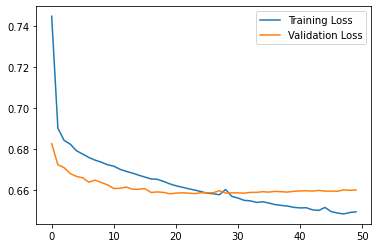

In [11]:
# This is just to plot our training set loss and validation loss.
# In a way, we can then limit the number of epochs if the previous one is too little or too much
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()

In [12]:
# Perform the TSNE on the bottleneck layer of the encoded data and the non encoded data
N_predict = 2000

# Make the encoder do its job. We can now store this as an output to a var
training_predicted = encoder.predict(train_data[:N_predict])

# Perform TSNE on 2 components so we can visualise it.
train_encoded = TSNE(n_components = 2, init = 'pca', random_state = 0).fit_transform(training_predicted)
train_unencoded = TSNE(n_components = 2, init = 'pca', random_state = 0).fit_transform(train_data[:N_predict])

# Perform TSNE on 3 components so we can visualise it.
train_encoded3d = TSNE(n_components = 3, init = 'pca', random_state = 0).fit_transform(training_predicted)
train_unencoded3d = TSNE(n_components = 3, init = 'pca', random_state = 0).fit_transform(train_data[:N_predict])

C:\Users\Darren\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Darren\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\Darren\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Darren\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\Darren\Ap

In [13]:
x = {'B cell' : 0, 'CD4' : 1, 'CD8' : 2,'MAIT' : 3,'Mono DC' : 4,'NK' : 5,'Progenitor Cells' : 6,'gdT' : 7}

# Dict to map back our 0-7 with names
dct = {v: k for k, v in x.items()}

# Not in place. For me to check if the labels map back correctly. It does!
train_labels.replace(dct)

a_TACGGGCCACTTAAGC-1                 CD8
a_CTGATAGCAGCTATTG-1                 gdT
a_GCGAGAACAGAGCCAA-1             Mono DC
a_CAGTAACTCCGGCACA-1             Mono DC
a_CATGACAGTTCCCTTG-1    Progenitor Cells
                              ...       
a_TGCCCTATCAACGGCC-1             Mono DC
b_CCAATCCCAGATCCAT-1                 CD4
a_GGCGACTCATCTCGCT-1                 CD8
a_GTGAAGGGTCCTCTTG-1             Mono DC
a_ATCATCTGTTCAGGCC-1                 CD4
Name: cell_int, Length: 18403, dtype: object

In [14]:
# Plotting colours!
color_map = {}

colors = ['#7312FE','#FF9900','#36FF00','#9AFBA4','#FF944E','#0500FF','#00D0FF','#FF0603']
for key, values in x.items():
    color_map[key] = colors[values]
    
color_map

{'B cell': '#7312FE',
 'CD4': '#FF9900',
 'CD8': '#36FF00',
 'MAIT': '#9AFBA4',
 'Mono DC': '#FF944E',
 'NK': '#0500FF',
 'Progenitor Cells': '#00D0FF',
 'gdT': '#FF0603'}

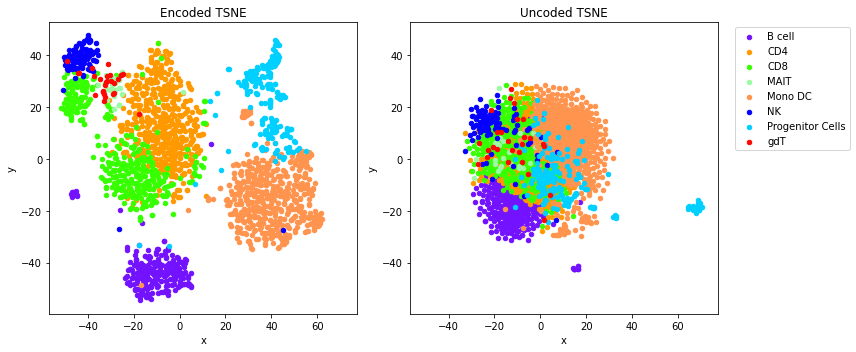

In [16]:
# This function is to plot on 2 components for visualization
# The input is the TSNE on encoded data, TSNE on uncoded data, the test labels so that we can colour it
# and the colour map
def vis_data(train_encoded, train_uncoded, train_labels, color_map):
    
    # Change the encoded data to a pandas df because im a giant mong and I like pandas better
    df_encoded = pd.DataFrame(train_encoded)
    # Tag the target to the dataframe
    df_encoded['Target'] = train_labels[:N_predict].replace(dct).values
    # Replace x and y axis column names for easier plotting later
    df_encoded=df_encoded.rename(columns={0: 'x', 1: 'y'})
    
    # Do the same for the uncoded data
    df_uncoded = pd.DataFrame(train_uncoded)
    df_uncoded['Target'] = train_labels[:N_predict].replace(dct).values
    df_uncoded=df_uncoded.rename(columns={0: 'x', 1: 'y'})
    df_uncoded

    # Before we plot, I would like to find out the min max so that our figure later have same axis
    x_min = min(df_encoded.min()['x'], df_uncoded.min()['x'])
    x_max = max(df_encoded.max()['x'], df_uncoded.max()['x'])
    
    y_min = min(df_encoded.min()['y'], df_uncoded.min()['y'])
    y_max = max(df_encoded.max()['y'], df_uncoded.max()['y'])    
    
    # Plot by targets so that we can colour them :)
    fig, ax = plt.subplots(nrows= 1, ncols = 2, figsize = (12,5))
    grouped = df_encoded.groupby('Target')
    for key, group in grouped:
        group.plot(ax=ax[0], kind='scatter', x='x', y='y', label=key, color=color_map[key])
        
    grouped = df_uncoded.groupby('Target')
    for key, group in grouped:
        group.plot(ax=ax[1], kind='scatter', x='x', y='y', label=key, color=color_map[key])
    
    for axes in ax:
        axes.set_xlim(x_min*1.1, x_max*1.1)
        axes.set_ylim(y_min*1.1, y_max*1.1)
    
    ax[1].set_title('Uncoded TSNE')
    ax[0].set_title('Encoded TSNE')
    ax[1].legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    ax[0].legend().set_visible(False)
    plt.tight_layout()
    plt.show()
    
vis_data(train_encoded,train_unencoded,train_labels,color_map)

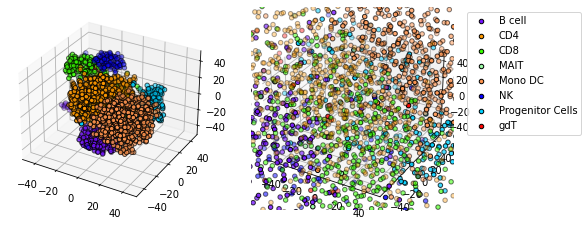

C:\Users\Darren\AppData\Local\Temp/ipykernel_9488/925186195.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=plt.figaspect(0.5))


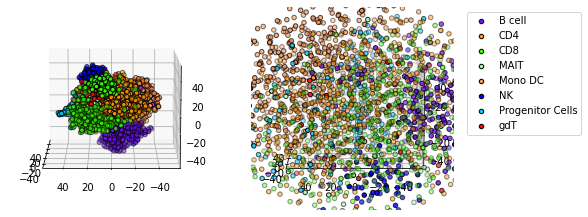

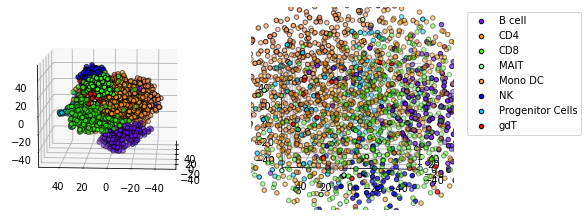

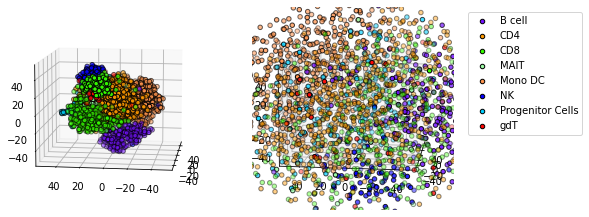

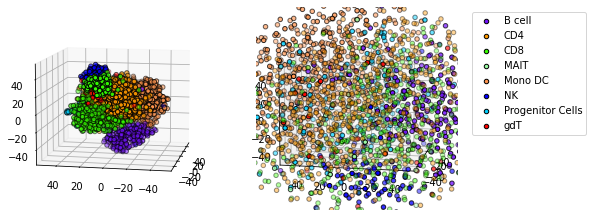

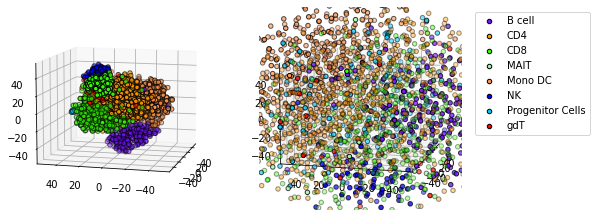

...

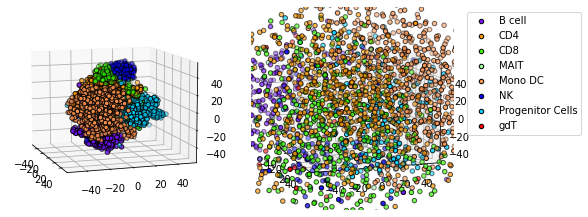

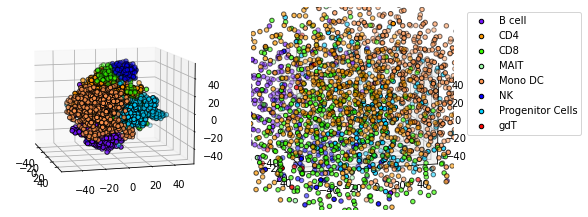

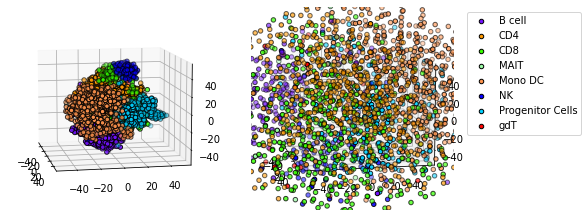

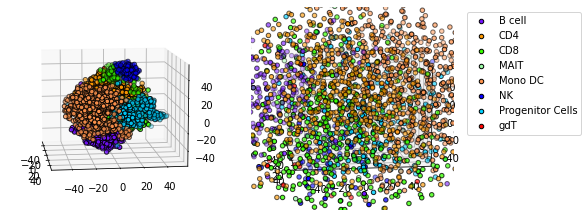

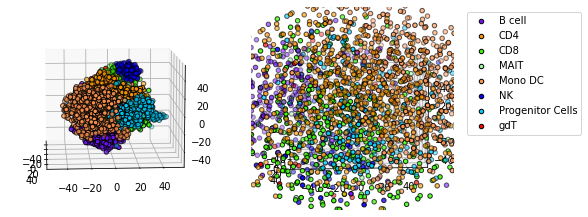

In [39]:
def vis_data_3d(x_train_encoded, x_train_unencoded, train_labels, color_map):
    
    # Change the encoded data to a pandas df because im a giant mong and I like pandas better
    df_encoded = pd.DataFrame(x_train_encoded)
    # Tag the target to the dataframe
    df_encoded['Target'] = train_labels[:N_predict].replace(dct).values
    # Replace x and y axis column names for easier plotting later
    df_encoded=df_encoded.rename(columns={0: 'x', 1: 'y', 2:'z'})
    
    # Change the encoded data to a pandas df because im a giant mong and I like pandas better
    df_unencoded = pd.DataFrame(x_train_unencoded)
    # Tag the target to the dataframe
    df_unencoded['Target'] = train_labels[:N_predict].replace(dct).values
    # Replace x and y axis column names for easier plotting later
    df_unencoded=df_unencoded.rename(columns={0: 'x', 1: 'y', 2:'z'})
    
    # Plotting in 3D
    fig = plt.figure(figsize=plt.figaspect(0.5))
    ax = fig.add_subplot(1, 2, 1, projection='3d')
    grouped = df_encoded.groupby('Target')
    for key, groupid in grouped.groups.items():
        x = df_encoded.iloc[groupid,0]
        y = df_encoded.iloc[groupid,1]
        z = df_encoded.iloc[groupid,2]
        ax.scatter(x,y,z, edgecolor='black', color=color_map[key])

    ax.set_xlim3d(-50,50)
    ax.set_ylim3d(-50,50)
    ax.set_zlim3d(-50,50)
        
    ax = fig.add_subplot(1, 2, 2, projection='3d')
    grouped = df_unencoded.groupby('Target')
    for key, groupid in grouped.groups.items():
        x = df_unencoded.iloc[groupid,0]
        y = df_unencoded.iloc[groupid,1]
        z = df_unencoded.iloc[groupid,2]
        ax.scatter(x,y,z, label=key, edgecolor='black', color=color_map[key])
    ax.legend(bbox_to_anchor=(1.04, 1), loc="upper left")       
    
    ax.set_xlim3d(-50,50)
    ax.set_ylim3d(-50,50)
    ax.set_zlim3d(-50,50)
    
    plt.show()
    

# TO BUILD A ANIMATION FRAMES.
def build_anim(x_train_encoded, x_train_unencoded, train_labels, color_map):
    # Change the encoded data to a pandas df because im a giant mong and I like pandas better
    df_encoded = pd.DataFrame(x_train_encoded)
    # Tag the target to the dataframe
    df_encoded['Target'] = train_labels[:N_predict].replace(dct).values
    # Replace x and y axis column names for easier plotting later
    df_encoded=df_encoded.rename(columns={0: 'x', 1: 'y', 2:'z'})
    
    # Change the encoded data to a pandas df because im a giant mong and I like pandas better
    df_unencoded = pd.DataFrame(x_train_unencoded)
    # Tag the target to the dataframe
    df_unencoded['Target'] = train_labels[:N_predict].replace(dct).values
    # Replace x and y axis column names for easier plotting later
    df_unencoded=df_unencoded.rename(columns={0: 'x', 1: 'y', 2:'z'})
    
    
    angles = np.linspace(180, 360, 50)
    i = 0
    for angle in angles:
        fig = plt.figure(figsize=plt.figaspect(0.5))
        ax = fig.add_subplot(1, 2, 1, projection='3d')
        ax.view_init(10, angle)
        grouped = df_encoded.groupby('Target')
        for key, groupid in grouped.groups.items():
            x = df_encoded.iloc[groupid,0]
            y = df_encoded.iloc[groupid,1]
            z = df_encoded.iloc[groupid,2]
            ax.scatter(x,y,z, edgecolor='black', color=color_map[key])

        ax.set_xlim3d(-55,55)
        ax.set_ylim3d(-55,55)
        ax.set_zlim3d(-55,55)
        
        ax = fig.add_subplot(1, 2, 2, projection='3d')
        ax.view_init(10, angle)
        grouped = df_unencoded.groupby('Target')
        for key, groupid in grouped.groups.items():
            x = df_unencoded.iloc[groupid,0]
            y = df_unencoded.iloc[groupid,1]
            z = df_unencoded.iloc[groupid,2]
            ax.scatter(x,y,z, label=key, edgecolor='black', color=color_map[key])
        ax.legend(bbox_to_anchor=(1.04, 1), loc="upper left")       

        ax.set_xlim3d(-55,55)
        ax.set_ylim3d(-55,55)
        ax.set_zlim3d(-55,55)
        outfile = 'anim/3dplot_step_' + f'{i:02}' + '.png'
        plt.savefig(outfile, dpi=150)
        i += 1
    call(['convert', '-delay', '50', 'anim/3dplot*', 'anim/3dplot_anim_' + str(2000) + '.gif'])
    plt.close()


vis_data_3d(train_encoded3d,train_unencoded3d,train_labels,color_map)
build_anim(train_encoded3d,train_unencoded3d,train_labels,color_map)

In [40]:
from PIL import Image
import glob

# Create the frames
frames = []
imgs = glob.glob("anim/*.png")
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)
    
for i in reversed(imgs):
    new_frame = Image.open(i)
    frames.append(new_frame)

# Save into a GIF file that loops forever
frames[0].save('anim/animation.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=100, loop=0)